In [1]:
import numpy as np
import scipy.io as sio
import pandas as pd

import matplotlib
import matplotlib.pyplot as plt
import cartopy
import cartopy.crs as ccrs
from cartopy.io.shapereader import Reader
from cartopy.feature import ShapelyFeature

In [29]:
composite_data_path = '/Volumes/data/seasonal-energy-drought-data/meteo_composite_data/'
drought_data_path = 'data/droughts'
plotdir = 'figures/'

In [2]:
def crt_subplot2grid_matrix(InRowSizes:list, InRowMasks:list, InColSizes:list, InColMasks:list, **argv):
    # This function handle the repeated codes of subplot2grid
    # Use: crt_subplot2grid_matrix(<InRowSizes>, <InRowMasks>, <InColSizes>, <InColMasks>, **argv)
    #       <InRowSizes>   Size distribution along the row dimension. e.g., [1,9,2,8]
    #       <InRowMasks>   Indicate which rows are the panel rows, which are "blank" rows.
    #                      Values are 0 or 1. e.g., [0,1,0,1]
    #       <InColSizes>   Size distribution along the column dimension. e.g., [1,9,2,8]
    #       <InColMasks>   Indicate which columns are the panel columns, which are "blank" columns.
    #                      Values are 0 or 1. e.g., [0,1,0,1]
    #       **argv         additional argument that is used in plt.subplot2grid, such as projection info.
    #
    # Author:  Xiaodong Chen (xiaodc@uw.edu)
    # v1.0
    #
    # Return: a list of lists, each embedded list includes the axes of each row
    #
    # Note: This function accepts the first row/column as "blank"
    
    
    my_TotRowDim = int(np.asarray(InRowSizes).sum())
    my_TotColDim = int(np.asarray(InColSizes).sum())
    my_ValidRows = np.asarray(InRowMasks).sum()
    my_ValidCols = np.asarray(InColMasks).sum()

    whole_axis_array = []

    rindex = 0
    for x in np.arange(len(InRowMasks)):
        if InRowMasks[x]==1:
            my_row = []
            cindex = 0
            for y in np.arange(len(InColMasks)):
                if InColMasks[y]==1:
                    axis = plt.subplot2grid((my_TotRowDim, my_TotColDim), (rindex, cindex), rowspan=InRowSizes[x], colspan=InColSizes[y], **argv)
                    my_row.append(axis)
                    #print('row %d col %d' % (x,y))
                cindex += InColSizes[y]

            whole_axis_array.append(my_row)

        rindex += InRowSizes[x]  # This is updated to record the starting index for each row
        
    return whole_axis_array

In [3]:
# Note: This function here differs from other script. It go through the list and make sure the same year/month is not counted many times.
#(i.e., for all events, output is only 96 instead of 232

def subset_ED_events_topX(in_ds, in_n=1, in_regionlist='all', in_months='all', in_syear='None', in_eyear='None'):
    
    # background info
    list_keys = ['ba', 'drought_id', 'drought_duration', 'severity_ws',
                 'severity_hws', 'severity_mwh', 'wind_gen_mwh', 'solar_gen_mwh',
                 'hydro_gen_mwh', 'year', 'month', 'wind_cf', 'solar_cf', 'hydro_cf',
                 'solar_s', 'wind_s', 'hydro_s']
    
        
    if in_syear=='None':
        in_syear = in_ds['year'].min()
    if in_eyear=='None':
        in_eyear = in_ds['year'].max()
    
    if in_regionlist=='all':
        in_regionlist = ['AECI', 'AVA', 'BPAT', 'CISO', 'ERCO', 'IPCO', 'ISNE', 'LDWP',
                         'MISO', 'NEVP', 'NWMT', 'NYIS', 'PACE', 'PACW', 'PGE', 'PJM',
                         'PSCO', 'PSEI', 'SPA', 'SRP', 'SWPP', 'TVA', 'WACM', 'WALC']
        
    if in_months=='all':
        in_months = np.arange(1,13)

    # now construct filters
    my_filter_region = np.zeros(in_ds['ba'].shape[0], dtype=bool)
    for inR in in_regionlist:
        #print(inR)
        my_filter_region = ( my_filter_region | (in_ds['ba']==inR).to_numpy() )
        
    my_filter_month = np.zeros(in_ds['ba'].shape[0], dtype=bool)
    for inM in in_months:
        my_filter_month = ( my_filter_month | (in_ds['month']==inM).to_numpy() )
        
    my_filter_year = np.zeros(in_ds['ba'].shape[0], dtype=bool)
    for inY in np.arange(in_syear, in_eyear+1):
        my_filter_year = ( my_filter_year | (in_ds['year']==inY).to_numpy() )
        
    outdata_raw1 = in_ds[(my_filter_region & my_filter_month & my_filter_year)].sort_values(by='severity_hws', ascending=False)
    
    #print('%.2f' % outdata_raw1['severity_hws'].to_numpy().min())
    outdata_raw = outdata_raw1[0:in_n]
    
    #print(outdata_raw)
    
    outdata = {}
    for mykey in ['syear', 'smonth', 'sday']:
        outdata[mykey] = np.zeros(outdata_raw.shape[0])
        
    for mykey in list_keys:
        outdata[mykey] = outdata_raw[mykey].to_numpy()
        
    for i in np.arange(outdata_raw.shape[0]):
        my_stamp = pd.to_datetime(in_ds['datetime_utc'][i])
        outdata['syear'][i] = my_stamp.year
        outdata['smonth'][i] = my_stamp.month
        outdata['sday'][i] = my_stamp.day
        
    # clean the data, removing duplicates
    tmpdata_YMunique = pd.DataFrame(data={'year':outdata['year'], 'month':outdata['month'], 'severity_hws':outdata['severity_hws']})
    outdata_YMunique = tmpdata_YMunique.drop_duplicates()
    
    outdata_unique = {}
    for key in ['year', 'month', 'severity_hws']:
        outdata_unique[key] = outdata_YMunique[key].to_numpy()
    
    return outdata_unique

In [5]:
def visualize_regional_map_nocinfo(axis, lons, lats, indata, cmap='bwr_r', color=False,
                                   map_bdy=False, location=[False,False,False,False], 
                                   vmax=10, vmin=-10, xlim=[-127,-100], ylim=[26,55], 
                                   title='',label='', titlesize=12, labelsize=10, labelx=-125, labely=31,
                                   glxloc=np.arange(-180,171,10), glyloc=np.arange(0,81,5), c_country='grey', **kwarg):
    if color!=False:
        axis.pcolormesh(lons, lats, indata, color=color, **kwarg)
    else:
        h1 = axis.pcolormesh(lons, lats, indata, cmap=cmap, vmax=vmax, vmin=vmin, zorder=2, **kwarg)

    axis.set_xlim(xlim)
    axis.set_ylim(ylim)

    if map_bdy==False:
        # turn off the bounding box for cartopy
        axis.spines['geo'].set_visible(False)

    axis.add_feature(cartopy.feature.OCEAN, linewidth=0.5, facecolor='none', edgecolor='k', zorder=0)
    axis.add_feature(cartopy.feature.LAND, linewidth=0.5, facecolor='none', edgecolor='k', zorder=1)


    countries = cartopy.feature.NaturalEarthFeature(category='cultural', scale='10m', edgecolor=c_country, linewidth=0.5,\
                                                    facecolor='none', name='admin_0_countries')
    axis.add_feature(countries, zorder=3)

    gl = axis.gridlines(crs=ccrs.PlateCarree(), draw_labels=True, linestyle='--', alpha=1,
                        x_inline=False, y_inline=False, xlocs=glxloc, ylocs=glyloc)
    gl.top_labels = location[0]
    gl.bottom_labels = location[1]
    gl.left_labels = location[2]
    gl.right_labels = location[3]

    axis.set_title(title, size=titlesize)
    axis.text(labelx, labely, label, ha='left', va='bottom', size=labelsize)
    
    return h1

In [7]:
dic_region = {1:'PSEI', 2:'CISO', 3:'AVA', 4:'NWMT', 5:'SWPP', 6:'PJM', 7:'TVA'}
dic_regions = {1:'PSEI/BPAT/PGE/PACW', 2:'CISO/LDWP', 3:'AVA/IPCO/NEVP/WALC/SRP', 4:'NWMT/PACE/WACM/PSCO', 5:'SWPP/SPA/AECI/ERCO/MISO', 6:'PJM/NYIS/ISNE', 7:'TVA'}
dic_regionlist = {1:['PSEI','BPAT','PGE','PACW'], 2:['CISO','LDWP'], 3:['AVA','IPCO','NEVP','WALC','SRP'], 4:['NWMT','PACE','WACM','PSCO'],
                  5:['SWPP','SPA','AECI','ERCO','MISO'], 6:['PJM','NYIS','ISNE'], 7:['TVA']}

In [8]:
# Note the several Portland locations has been modified
dic_BA_ll = {'AECI': (37.164480, -92.340620),
             'AVA': (47.671840, -117.389130),
             'BPAT': (46.529020, -121.656010),
             'CISO': (35.643670, -118.148440),
             'ERCO': (30.2161924, -97.6923943),
             'IPCO': (43.6188741, -116.2082252),
             'ISNE': (44.186145, -72.638098),
             'LDWP': (34.053345, -117.242349),
             'MISO': (39.9669123, -86.1440167),
             'NEVP': (38.1444834, -115.2250056),
             'NWMT': (46.0135562, -112.5342486),
             'NYIS': (42.6484431, -75.7075906),
             'PACE': (40.515118, -111.679485),
             'PACW': (43.515118, -122.679485),
             'PGE': (45.2160458, -122.6747919),
             'PJM': (41.1217669, -77.418534),
             'PSCO': (38.7512219, -104.9944326),
             'PSEI': (47.9138754, -121.5016751),
             'SPA': (35.5513637, -95.1383404),
             'SRP': (32.448253, -112.076617),
             'SWPP': (37.7525371, -98.448785),
             'TVA': (35.9661769, -83.920636),
             'WACM': (41.3939846, -105.0706003),
             'WALC': (34.448253, -110.076617)}

In [9]:
cmap_div = matplotlib.cm.bwr
cmap_base = matplotlib.cm.viridis
cmap_ch = matplotlib.cm.coolwarm
cmap_T = matplotlib.cm.coolwarm

In [10]:
zoom_proj = ccrs.PlateCarree(central_longitude=180)

In [16]:
def retrieve_composite(in_BA, opt_flag='p40', opt_topn=4):
    
    if opt_flag=='p30' or opt_flag=='p40':
        infile_anom = '%s/%s_weighted/composite_anom.weighted.%s.%s.mat' % (composite_data_path, opt_flag, opt_flag, dic_region[in_BA])
        infile_base = '%s/%s_weighted/composite_base.weighted.%s.%s.mat' % (composite_data_path, opt_flag, opt_flag, dic_region[in_BA])
    elif opt_flag=='topX':
        infile_anom = '%s/top%d/composite_anom.weighted.top%d.%s.mat' % (composite_data_path, opt_topn, opt_topn, dic_region[in_BA])
        infile_base = '%s/top%d/composite_base.weighted.top%d.%s.mat' % (composite_data_path, opt_topn, opt_topn, dic_region[in_BA])
        
    print('Loading anomaly from %s' % infile_anom)
    composite_anom = sio.loadmat(infile_anom, squeeze_me=True)

    print('Loading base from %s' % infile_base)
    composite_base = sio.loadmat(infile_base, squeeze_me=True)

    lat = composite_anom['lat']
    lon = composite_anom['lon']
    
    return composite_anom, composite_base, lat, lon

In [17]:
_, _, lat, lon = retrieve_composite(1)

Loading anomaly from /Volumes/data/seasonal-energy-drought-data/meteo_composite_data//p40_weighted/composite_anom.weighted.p40.PSEI.mat
Loading base from /Volumes/data/seasonal-energy-drought-data/meteo_composite_data//p40_weighted/composite_base.weighted.p40.PSEI.mat


#### Look for max. values for plotting

In [18]:
varlist = ['T-200', 'GPH-500', 'T-500', 'windSH-850', 'T-850', 'RH-850', 'T2', 'MSL', 'IWV', 'wind10', 'VPD']

dic_max_anom = {}
dic_min_base = {}
dic_max_base = {}

for var in varlist:
    
    tmp_max_array_anom = np.zeros((7,2))
    tmp_max_array_base = np.zeros((7,2))
    tmp_min_array_base = np.zeros((7,2))

    for Rid in np.arange(1,8):
        
        my_composite_anom, my_composite_base, _, _ = retrieve_composite(Rid, opt_flag='p30')
        
        tmp_max_array_anom[Rid-1,0] = np.maximum(my_composite_anom[var][120:481,480:1400].max(), my_composite_anom[var][120:481,480:1400].min()*-1)
        tmp_max_array_base[Rid-1,0] = my_composite_base[var][120:481,480:1400].max()
        tmp_min_array_base[Rid-1,0] = my_composite_base[var][120:481,480:1400].min()
        
        my_composite_anom, my_composite_base, _, _ = retrieve_composite(Rid, opt_flag='p40')
        
        tmp_max_array_anom[Rid-1,1] = np.maximum(my_composite_anom[var][120:481,480:1400].max(), my_composite_anom[var][120:481,480:1400].min()*-1)
        tmp_max_array_base[Rid-1,1] = my_composite_base[var][120:481,480:1400].max()
        tmp_min_array_base[Rid-1,1] = my_composite_base[var][120:481,480:1400].min()
        
    dic_max_anom[var] = np.nanmax(tmp_max_array_anom)
    dic_max_base[var] = np.nanmax(tmp_max_array_base)
    dic_min_base[var] = np.nanmin(tmp_min_array_base)

Loading anomaly from /Volumes/data/seasonal-energy-drought-data/meteo_composite_data//p30_weighted/composite_anom.weighted.p30.PSEI.mat
Loading base from /Volumes/data/seasonal-energy-drought-data/meteo_composite_data//p30_weighted/composite_base.weighted.p30.PSEI.mat
Loading anomaly from /Volumes/data/seasonal-energy-drought-data/meteo_composite_data//p40_weighted/composite_anom.weighted.p40.PSEI.mat
Loading base from /Volumes/data/seasonal-energy-drought-data/meteo_composite_data//p40_weighted/composite_base.weighted.p40.PSEI.mat
Loading anomaly from /Volumes/data/seasonal-energy-drought-data/meteo_composite_data//p30_weighted/composite_anom.weighted.p30.CISO.mat
Loading base from /Volumes/data/seasonal-energy-drought-data/meteo_composite_data//p30_weighted/composite_base.weighted.p30.CISO.mat
Loading anomaly from /Volumes/data/seasonal-energy-drought-data/meteo_composite_data//p40_weighted/composite_anom.weighted.p40.CISO.mat
Loading base from /Volumes/data/seasonal-energy-drought-d

In [19]:
dic_units = {}
dic_units['T-200'] = 'K'
dic_units['GPH-500'] = 'm'
dic_units['T-500'] = 'K'
dic_units['windSH-850'] = 'm/s'
dic_units['T-850'] = 'K'
dic_units['RH-850'] = '%'
dic_units['T2'] = 'K'
dic_units['MSL'] = 'Pa'
dic_units['IWV'] = 'mm'
dic_units['wind10'] = 'm/s'
dic_units['VPD'] = 'Pa'

In [20]:
# for quivers
qint = 30
qXs = lon[0:1440:qint]
qYs = lat[0:721:qint]
qY, qX = np.meshgrid(qYs, qXs)

In [22]:
pthre, opt_topn = 40, 4
#pthre, opt_topn = 30, 10

reffile = '%s/wsh_p%d_droughts.csv' % (drought_data_path, pthre)
YMfull = pd.read_csv(reffile)

In [23]:
for Rid in np.arange(1,8):
    tmpdata = subset_ED_events_topX(YMfull, in_n=10, in_regionlist=dic_regionlist[Rid], in_months=[1,2,3,4,5,6,7,8,9,10,11,12])
    
    for i in np.arange(tmpdata['year'].shape[0]):
        if tmpdata['year'][i]==1985 or tmpdata['year'][i]==1986 or tmpdata['year'][i]==2000 or tmpdata['year'][i]==2001 or tmpdata['year'][i]==2019:
            print(Rid, tmpdata['year'][i], tmpdata['month'][i])

1 1985 12
1 2001 2
1 2019 11
2 2019 11
2 2019 11
3 2019 11
3 2019 11
3 1985 12
5 1986 12


### anomaly

Loading anomaly from /Volumes/data/seasonal-energy-drought-data/meteo_composite_data//top4/composite_anom.weighted.top4.PSEI.mat
Loading base from /Volumes/data/seasonal-energy-drought-data/meteo_composite_data//top4/composite_base.weighted.top4.PSEI.mat
figures/composite_anomaly_top4_R1.png


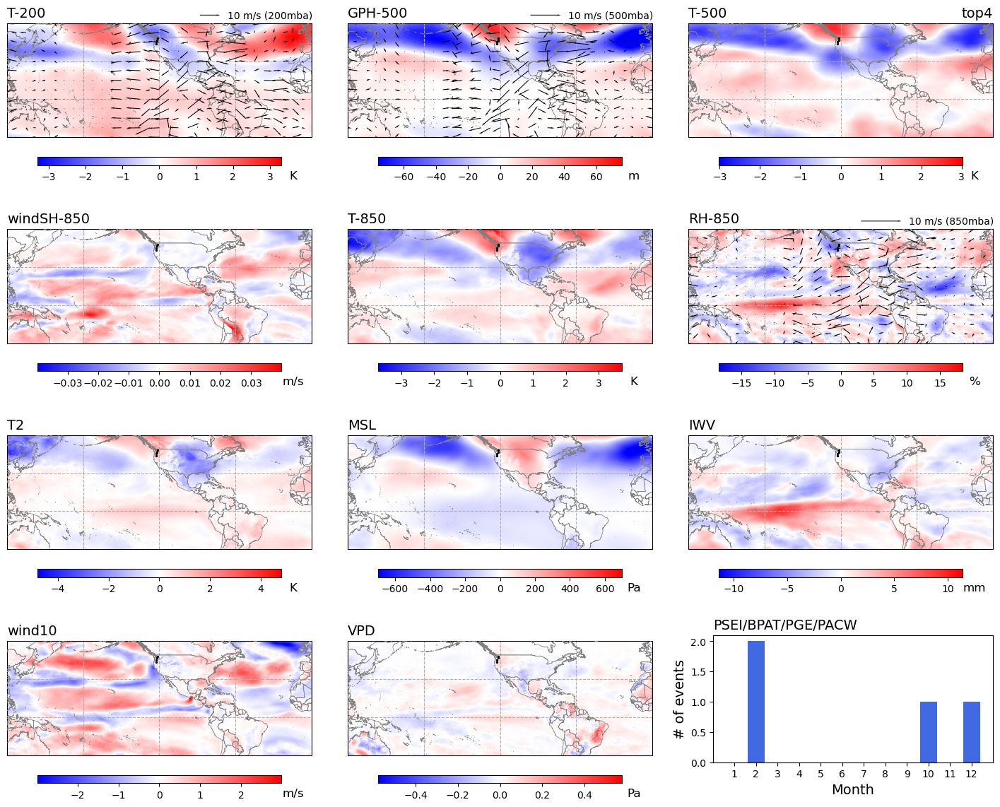

Loading anomaly from /Volumes/data/seasonal-energy-drought-data/meteo_composite_data//top4/composite_anom.weighted.top4.CISO.mat
Loading base from /Volumes/data/seasonal-energy-drought-data/meteo_composite_data//top4/composite_base.weighted.top4.CISO.mat
figures/composite_anomaly_top4_R2.png


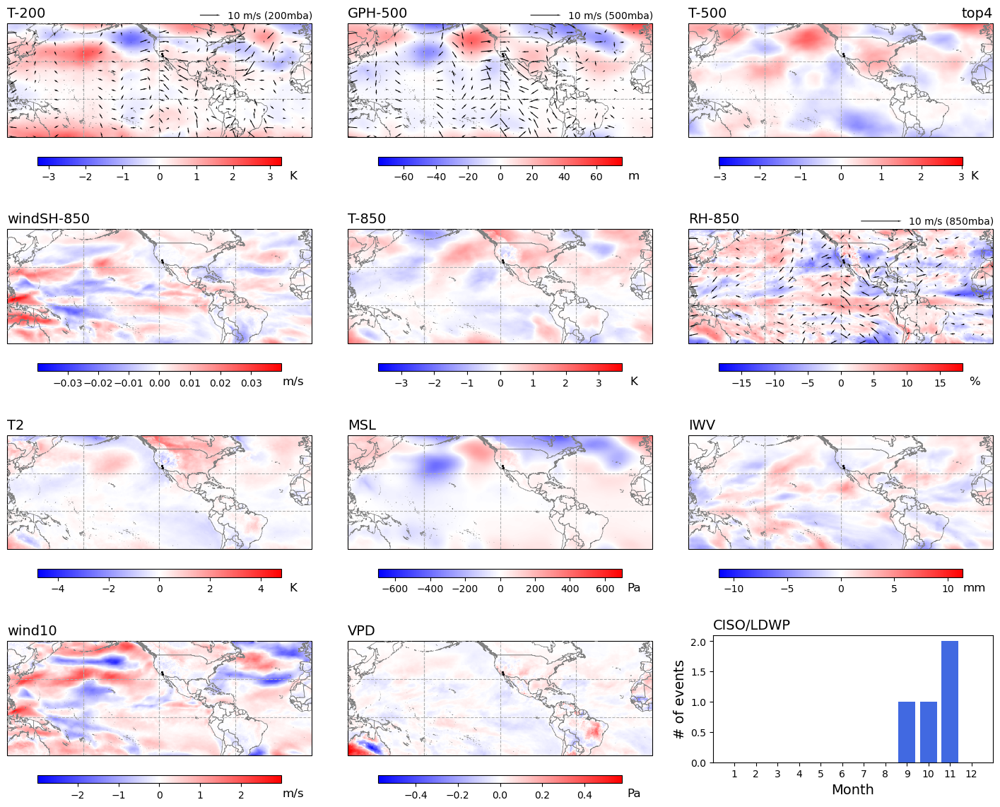

Loading anomaly from /Volumes/data/seasonal-energy-drought-data/meteo_composite_data//top4/composite_anom.weighted.top4.AVA.mat
Loading base from /Volumes/data/seasonal-energy-drought-data/meteo_composite_data//top4/composite_base.weighted.top4.AVA.mat
figures/composite_anomaly_top4_R3.png


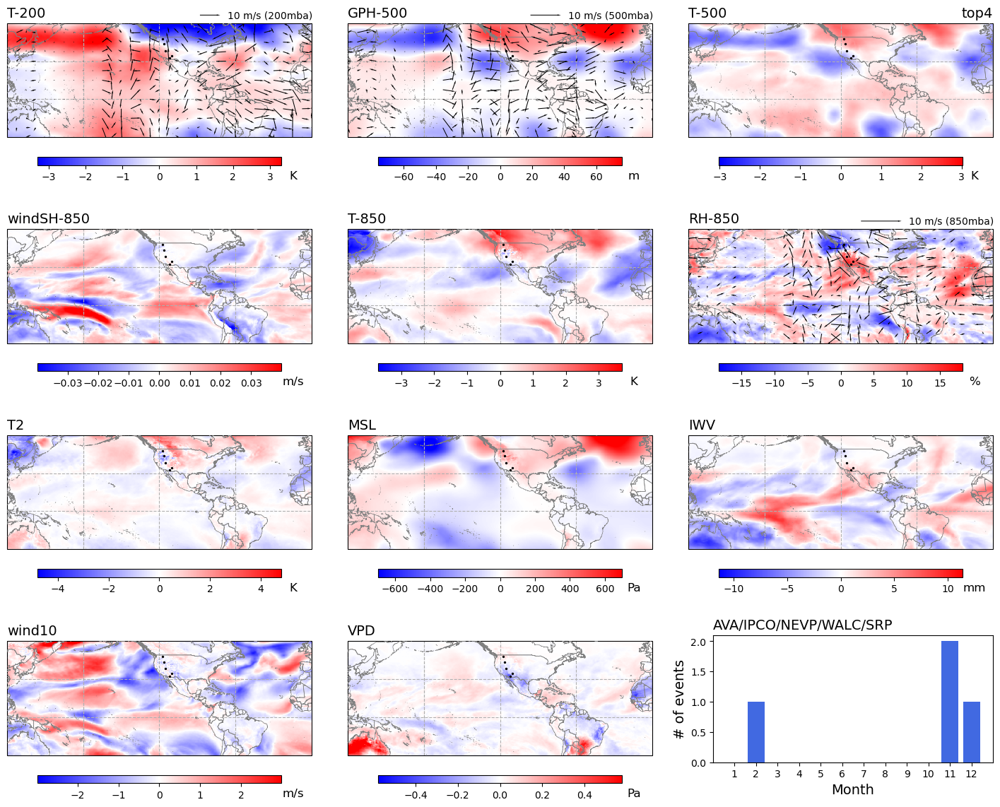

Loading anomaly from /Volumes/data/seasonal-energy-drought-data/meteo_composite_data//top4/composite_anom.weighted.top4.NWMT.mat
Loading base from /Volumes/data/seasonal-energy-drought-data/meteo_composite_data//top4/composite_base.weighted.top4.NWMT.mat
figures/composite_anomaly_top4_R4.png


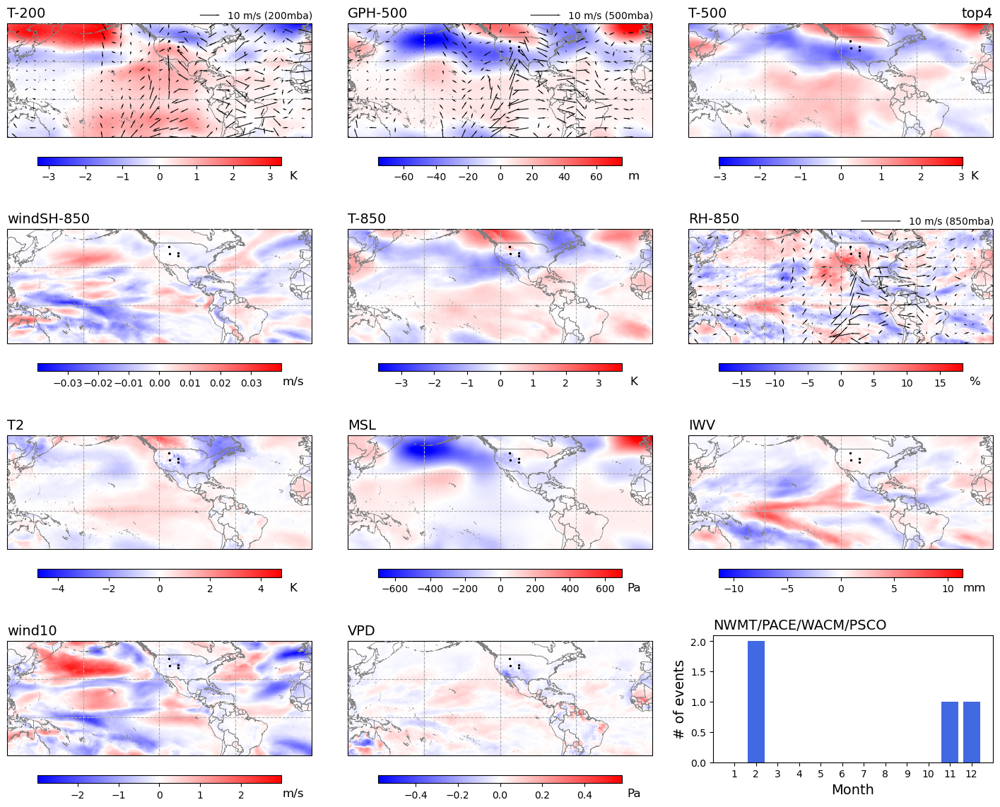

Loading anomaly from /Volumes/data/seasonal-energy-drought-data/meteo_composite_data//top4/composite_anom.weighted.top4.SWPP.mat
Loading base from /Volumes/data/seasonal-energy-drought-data/meteo_composite_data//top4/composite_base.weighted.top4.SWPP.mat
figures/composite_anomaly_top4_R5.png


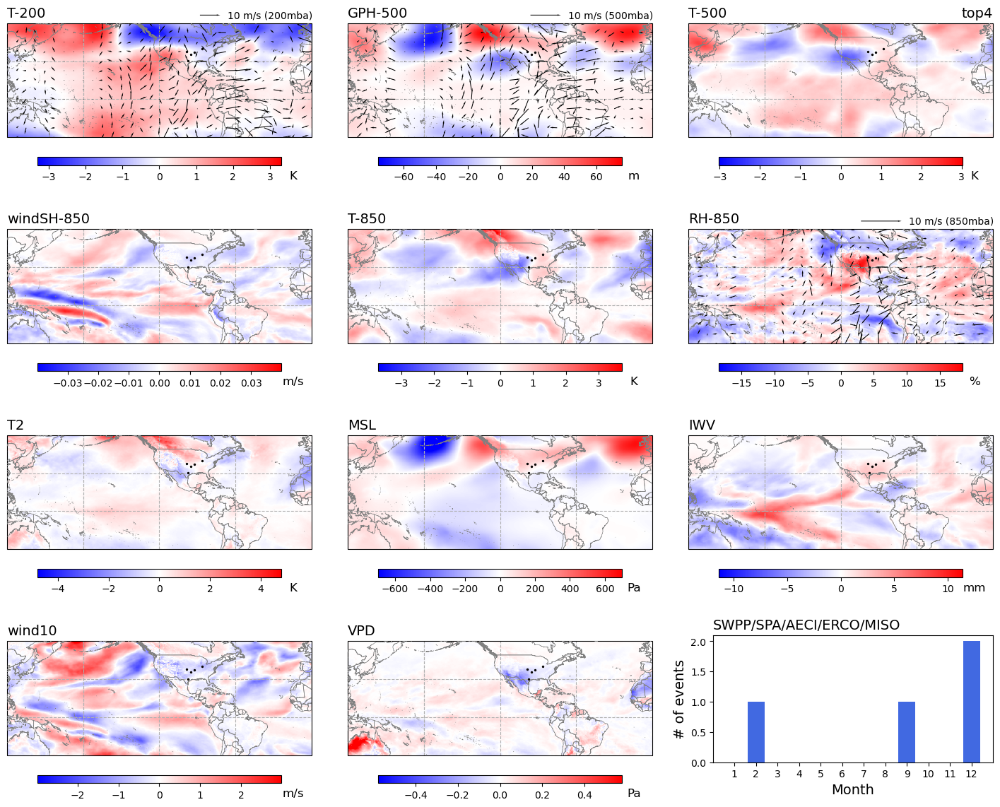

Loading anomaly from /Volumes/data/seasonal-energy-drought-data/meteo_composite_data//top4/composite_anom.weighted.top4.PJM.mat
Loading base from /Volumes/data/seasonal-energy-drought-data/meteo_composite_data//top4/composite_base.weighted.top4.PJM.mat
figures/composite_anomaly_top4_R6.png


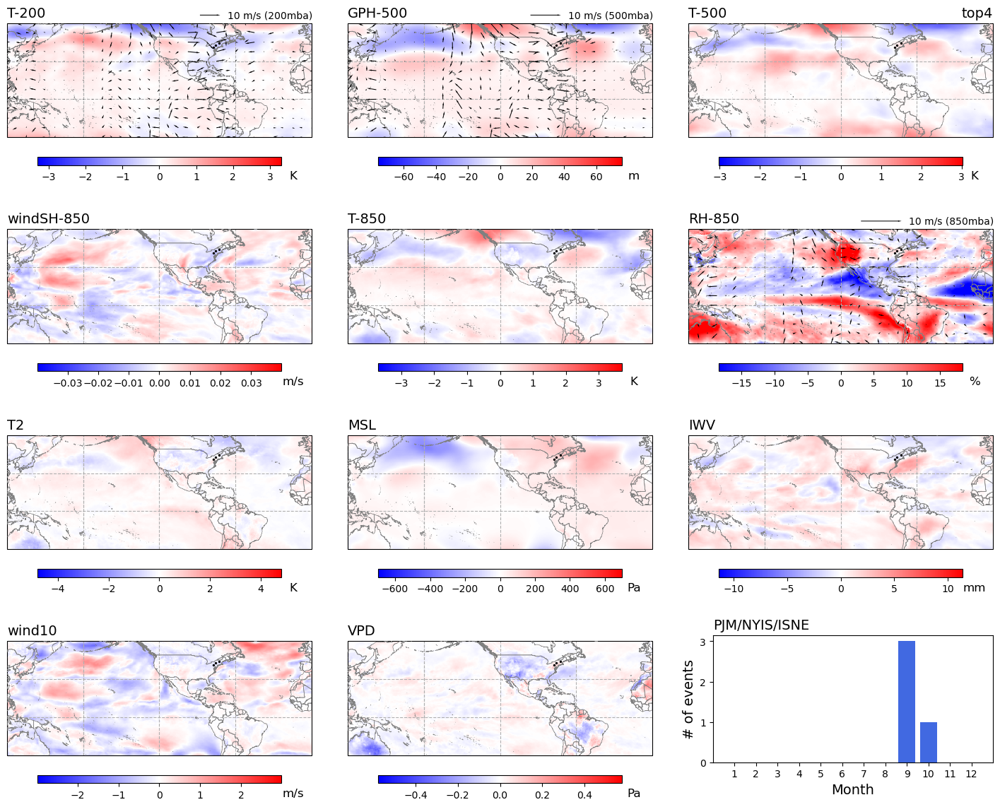

Loading anomaly from /Volumes/data/seasonal-energy-drought-data/meteo_composite_data//top4/composite_anom.weighted.top4.TVA.mat
Loading base from /Volumes/data/seasonal-energy-drought-data/meteo_composite_data//top4/composite_base.weighted.top4.TVA.mat
figures/composite_anomaly_top4_R7.png


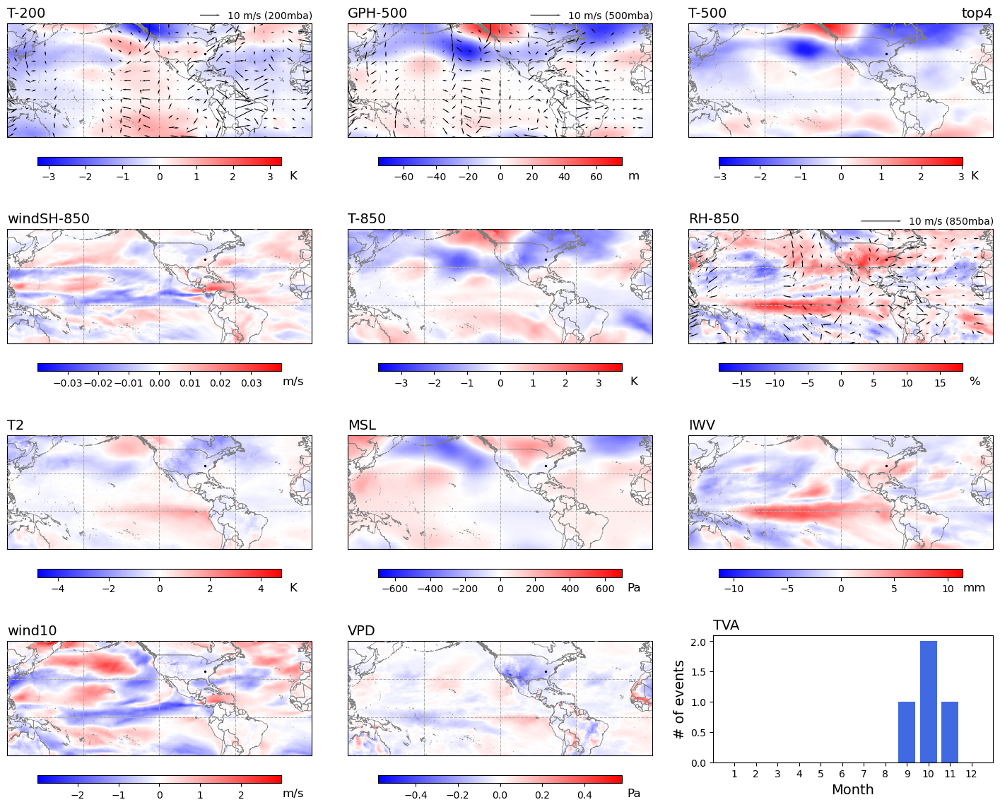

In [31]:
pthre, opt_topn = 40, 4
#pthre, opt_topn = 30, 10

reffile = '%s/wsh_p%d_droughts.csv' % (drought_data_path, pthre)
YMfull = pd.read_csv(reffile)

for Rid in np.arange(1,8):

    composite_anom, composite_base, _, _ = retrieve_composite(Rid, opt_flag='topX', opt_topn=opt_topn)
    
    my_data = subset_ED_events_topX(YMfull, in_n=opt_topn, in_regionlist=dic_regionlist[Rid], in_months=[1,2,3,4,5,6,7,8,9,10,11,12])

    bar_y = np.zeros(12)
    for i in np.arange(12):
        
        bar_y[i] = (my_data['month']==(i+1)).sum()


    fig_anom = plt.figure(figsize=(18,15))
    [axes1, axes2, axes3] = crt_subplot2grid_matrix([30,1,30,1,30,1,30], [1,0,1,0,1,0,0], [10,1,10,1,10], [1,0,1,0,1], projection=zoom_proj)
    [axes4] = crt_subplot2grid_matrix([30,1,30,1,30,1,30], [0,0,0,0,0,0,1], [10,1,10,1,10], [1,0,1,0,0], projection=zoom_proj)
    axes_full = axes1 + axes2 + axes3 + axes4
    ax_bar = fig_anom.add_axes([0.68, 0.15, 0.22, 0.12])

    # row 1
    opt_location = [False, False, False, False]
    for plotvar, axis in zip(['T-200', 'GPH-500', 'T-500', 'windSH-850', 'T-850', 'RH-850', 'T2', 'MSL', 'IWV', 'wind10', 'VPD'],
                             axes_full):

        #vmax = np.maximum(composite_anom[plotvar].max(), composite_anom[plotvar].min()*-1)
        h1 = visualize_regional_map_nocinfo(axis, lon+180, lat, composite_anom[plotvar], cmap=cmap_div, vmax=dic_max_anom[plotvar], vmin=-1*dic_max_anom[plotvar],
                                            location=opt_location, map_bdy=True, glxloc=np.arange(-180, 181, 60), glyloc=np.arange(-90, 91, 30), c_country='grey')

        axis.set_title(plotvar, loc='left', fontsize=14)

        axis.set_xlim([-60,180])
        axis.set_ylim([-30,60])
        cb1 = plt.colorbar(h1, ax=axis, location='bottom', orientation='horizontal', shrink=0.8, aspect=30, pad=0.1)
        cb1.set_label(label=dic_units[plotvar], labelpad=-12, x=1.05, size=12)
        
            # add sites
        for my_stn in dic_regionlist[Rid]:
            my_ll = dic_BA_ll[my_stn]
            my_color = matplotlib.cm.tab10(0.5)
            axis.scatter(my_ll[1]+180, my_ll[0], s=2, facecolor=my_color, edgecolor='black', alpha=1, zorder=3)



    # bar plot
    ax_bar.bar(np.arange(1,13), bar_y, facecolor='royalblue')
    ax_bar.set_xticks(np.arange(1,13))
    ax_bar.set_xlabel('Month', fontsize=14)
    ax_bar.set_ylabel('# of events', fontsize=14)
    ax_bar.set_title(dic_regions[Rid], loc='left', fontsize=14)



    # add quiver
    plev = 200
    qdata_X = composite_anom['U-%d'%plev][0:721:qint, 0:1440:qint]
    qdata_Y = composite_anom['V-%d'%plev][0:721:qint, 0:1440:qint]
    q = axes1[0].quiver(qX, qY, qdata_X, qdata_Y, headwidth=2, zorder=5, scale=150)
    axes1[0].quiverkey(q, 0.7, 1.07, U=10, coordinates='axes', label='10 m/s (%dmba)'%plev, labelpos='E')

    plev = 500
    qdata_X = composite_anom['U-%d'%plev][0:721:qint, 0:1440:qint]
    qdata_Y = composite_anom['V-%d'%plev][0:721:qint, 0:1440:qint]
    q = axes1[1].quiver(qX, qY, qdata_X, qdata_Y, headwidth=2, zorder=5, scale=100)
    axes1[1].quiverkey(q, 0.7, 1.07, U=10, coordinates='axes', label='10 m/s (%dmba)'%plev, labelpos='E')

    plev = 850
    qdata_X = composite_anom['U-%d'%plev][0:721:qint, 0:1440:qint]
    qdata_Y = composite_anom['V-%d'%plev][0:721:qint, 0:1440:qint]
    q = axes2[2].quiver(qX, qY, qdata_X, qdata_Y, headwidth=2, zorder=5, scale=75)
    axes2[2].quiverkey(q, 0.7, 1.07, U=10, coordinates='axes', label='10 m/s (%dmba)'%plev, labelpos='E')
    

    # add some notations
    axes1[2].set_title('top%d' % opt_topn, loc='right', fontsize=14)

    figname = plotdir + 'composite_anomaly_top%d_R%d.png' % (opt_topn, Rid)
    print(figname)
    fig_anom.savefig(figname, dpi=300)

    plt.show()
    plt.close()
    del(fig_anom)

## climatology

Now we simplified the climatolgy. See step03 script

Loading anomaly from /Volumes/data/seasonal-energy-drought-data/meteo_composite_data//top4/composite_anom.weighted.top4.PSEI.mat
Loading base from /Volumes/data/seasonal-energy-drought-data/meteo_composite_data//top4/composite_base.weighted.top4.PSEI.mat
figures/composite_base_top4_R1.png


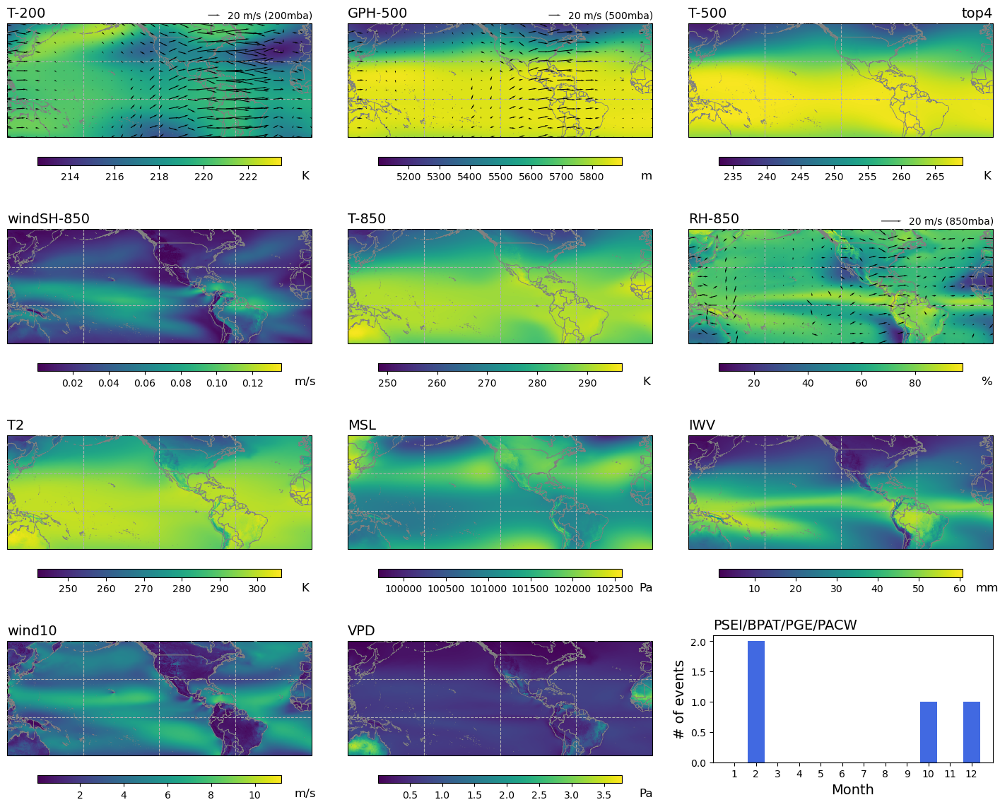

Loading anomaly from /Volumes/data/seasonal-energy-drought-data/meteo_composite_data//top4/composite_anom.weighted.top4.CISO.mat
Loading base from /Volumes/data/seasonal-energy-drought-data/meteo_composite_data//top4/composite_base.weighted.top4.CISO.mat
figures/composite_base_top4_R2.png


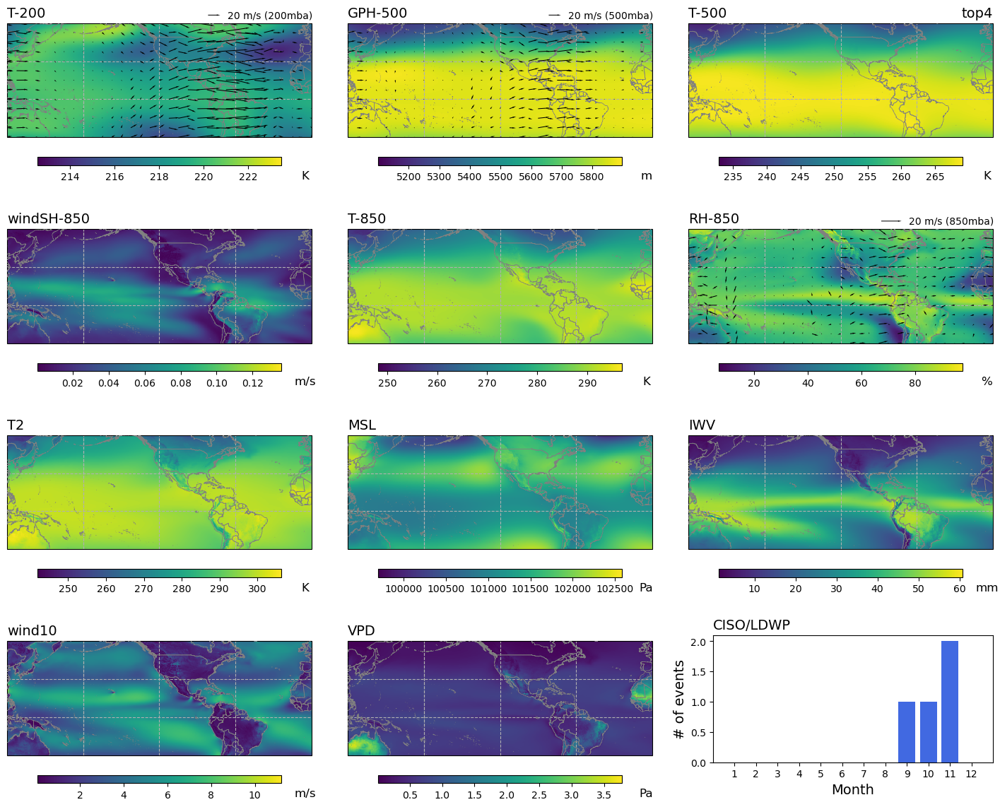

Loading anomaly from /Volumes/data/seasonal-energy-drought-data/meteo_composite_data//top4/composite_anom.weighted.top4.AVA.mat
Loading base from /Volumes/data/seasonal-energy-drought-data/meteo_composite_data//top4/composite_base.weighted.top4.AVA.mat
figures/composite_base_top4_R3.png


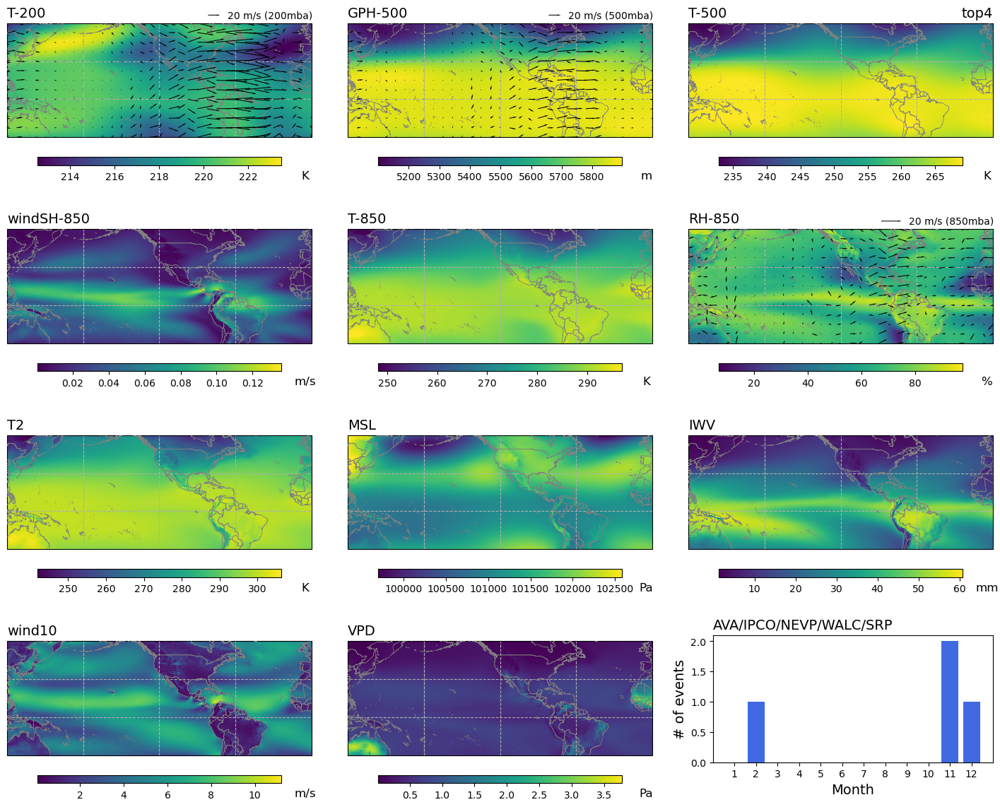

Loading anomaly from /Volumes/data/seasonal-energy-drought-data/meteo_composite_data//top4/composite_anom.weighted.top4.NWMT.mat
Loading base from /Volumes/data/seasonal-energy-drought-data/meteo_composite_data//top4/composite_base.weighted.top4.NWMT.mat
figures/composite_base_top4_R4.png


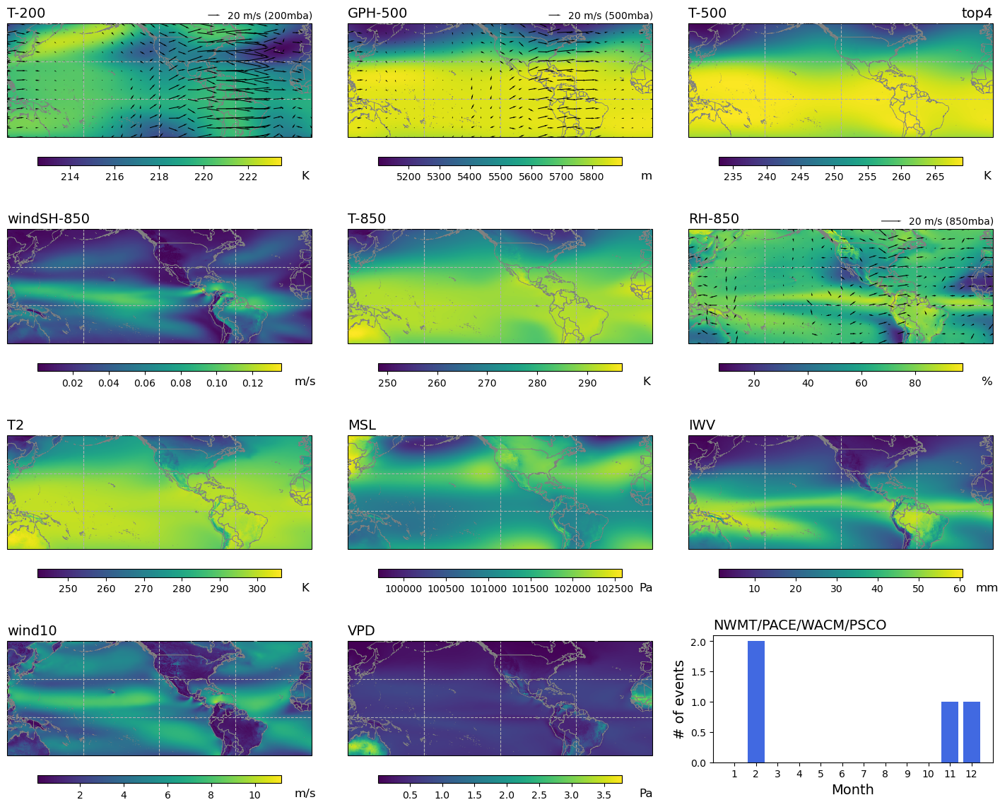

Loading anomaly from /Volumes/data/seasonal-energy-drought-data/meteo_composite_data//top4/composite_anom.weighted.top4.SWPP.mat
Loading base from /Volumes/data/seasonal-energy-drought-data/meteo_composite_data//top4/composite_base.weighted.top4.SWPP.mat
figures/composite_base_top4_R5.png


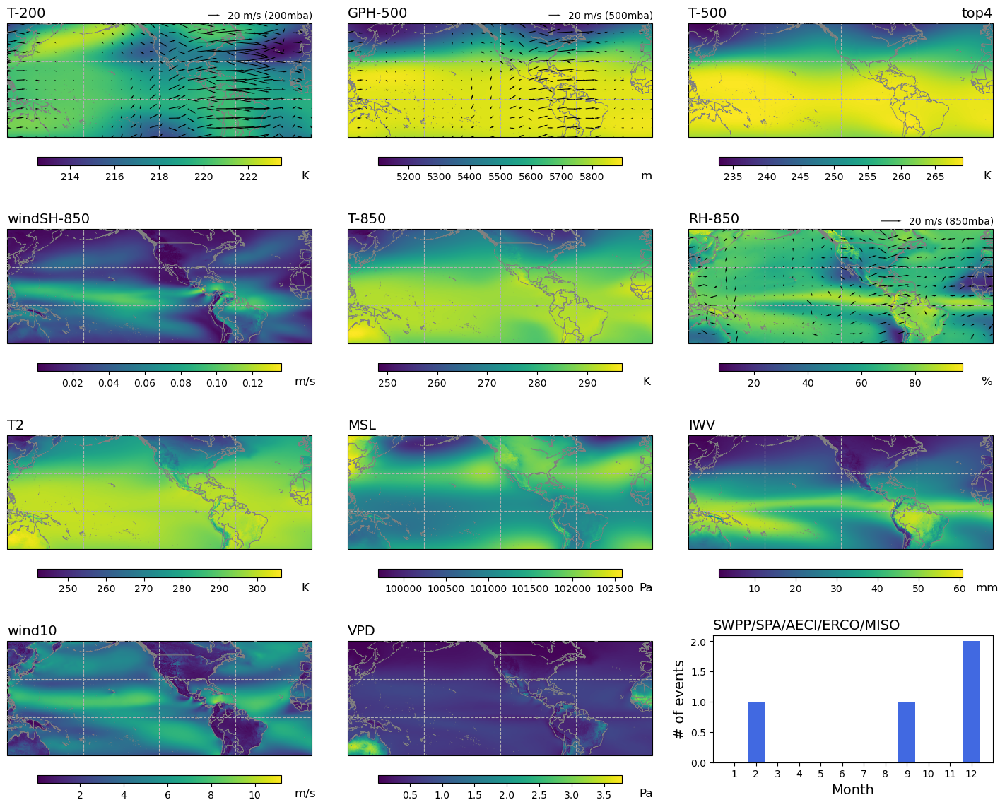

Loading anomaly from /Volumes/data/seasonal-energy-drought-data/meteo_composite_data//top4/composite_anom.weighted.top4.PJM.mat
Loading base from /Volumes/data/seasonal-energy-drought-data/meteo_composite_data//top4/composite_base.weighted.top4.PJM.mat
figures/composite_base_top4_R6.png


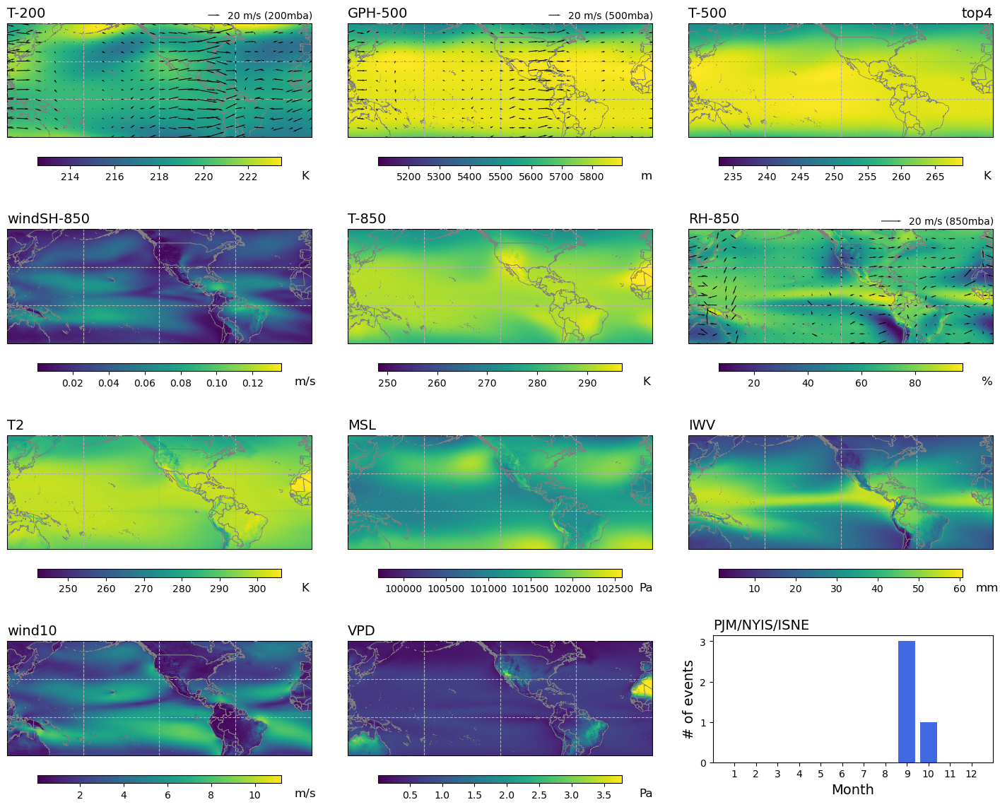

Loading anomaly from /Volumes/data/seasonal-energy-drought-data/meteo_composite_data//top4/composite_anom.weighted.top4.TVA.mat
Loading base from /Volumes/data/seasonal-energy-drought-data/meteo_composite_data//top4/composite_base.weighted.top4.TVA.mat
figures/composite_base_top4_R7.png


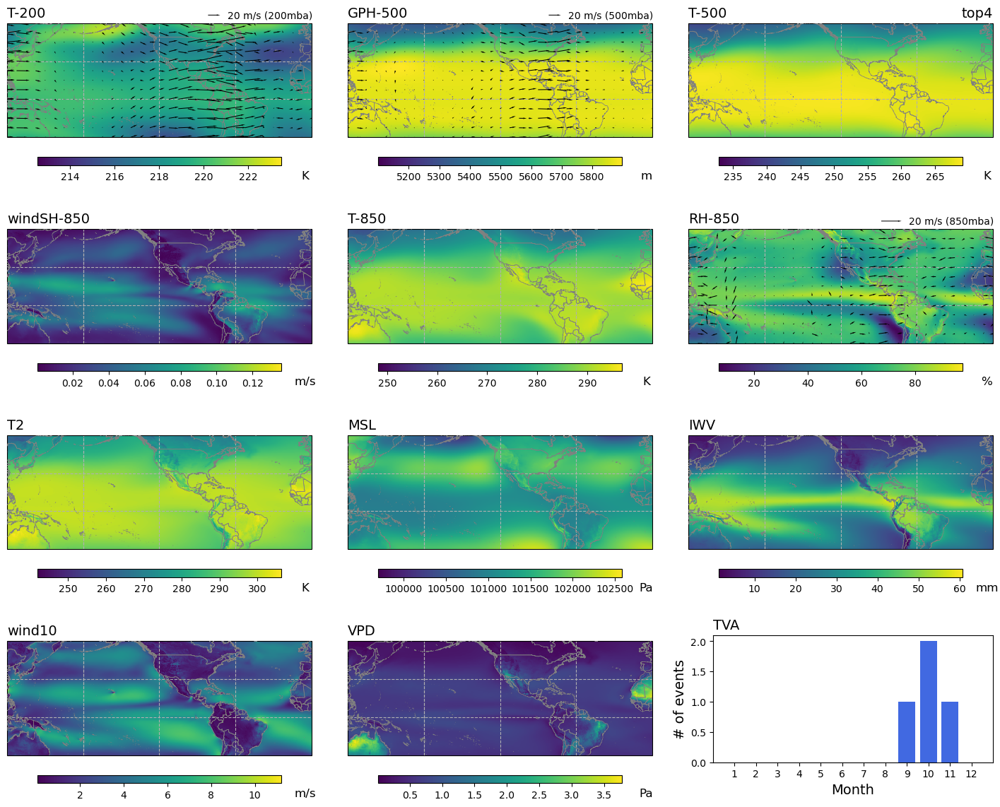

In [33]:
pthre, opt_topn = 40, 4
#pthre, opt_topn = 30, 10

reffile = '%s/wsh_p%d_droughts.csv' % (drought_data_path, pthre)
YMfull = pd.read_csv(reffile)

for Rid in np.arange(1,8):
    
    composite_anom, composite_base, _, _ = retrieve_composite(Rid, opt_flag='topX', opt_topn=opt_topn)

    my_data = subset_ED_events_topX(YMfull, in_n=opt_topn, in_regionlist=dic_regionlist[Rid], in_months=[1,2,3,4,5,6,7,8,9,10,11,12])

    bar_y = np.zeros(12)
    for i in np.arange(12):
        
        bar_y[i] = (my_data['month']==(i+1)).sum()


    fig_anom = plt.figure(figsize=(18,15))
    [axes1, axes2, axes3] = crt_subplot2grid_matrix([30,1,30,1,30,1,30], [1,0,1,0,1,0,0], [10,1,10,1,10], [1,0,1,0,1], projection=zoom_proj)
    [axes4] = crt_subplot2grid_matrix([30,1,30,1,30,1,30], [0,0,0,0,0,0,1], [10,1,10,1,10], [1,0,1,0,0], projection=zoom_proj)
    axes_full = axes1 + axes2 + axes3 + axes4
    ax_bar = fig_anom.add_axes([0.68, 0.15, 0.22, 0.12])

    # row 1
    opt_location = [False, False, False, False]
    for plotvar, axis in zip(['T-200', 'GPH-500', 'T-500', 'windSH-850', 'T-850', 'RH-850', 'T2', 'MSL', 'IWV', 'wind10', 'VPD'],
                             axes_full):

        h1 = visualize_regional_map_nocinfo(axis, lon+180, lat, composite_base[plotvar], cmap=cmap_base, vmax=dic_max_base[plotvar], vmin=dic_min_base[plotvar],
                                            location=opt_location, map_bdy=True, glxloc=np.arange(-180, 181, 60), glyloc=np.arange(-90, 91, 30), c_country='grey')

        axis.set_title(plotvar, loc='left', fontsize=14)

        axis.set_xlim([-60,180])
        axis.set_ylim([-30,60])
        cb1 = plt.colorbar(h1, ax=axis, location='bottom', orientation='horizontal', shrink=0.8, aspect=30, pad=0.1)
        cb1.set_label(label=dic_units[plotvar], labelpad=-12, x=1.1, size=12)



    # bar plot
    ax_bar.bar(np.arange(1,13), bar_y, facecolor='royalblue')
    ax_bar.set_xticks(np.arange(1,13))
    ax_bar.set_xlabel('Month', fontsize=14)
    ax_bar.set_ylabel('# of events', fontsize=14)
    ax_bar.set_title(dic_regions[Rid], loc='left', fontsize=14)



    # add quiver
    plev = 200
    qdata_X = composite_base['U-%d'%plev][0:721:qint, 0:1440:qint]
    qdata_Y = composite_base['V-%d'%plev][0:721:qint, 0:1440:qint]
    q = axes1[0].quiver(qX, qY, qdata_X, qdata_Y, headwidth=2, zorder=5, scale=500)
    axes1[0].quiverkey(q, 0.7, 1.07, U=20, coordinates='axes', label='20 m/s (%dmba)'%plev, labelpos='E')

    plev = 500
    qdata_X = composite_base['U-%d'%plev][0:721:qint, 0:1440:qint]
    qdata_Y = composite_base['V-%d'%plev][0:721:qint, 0:1440:qint]
    q = axes1[1].quiver(qX, qY, qdata_X, qdata_Y, headwidth=2, zorder=5, scale=500)
    axes1[1].quiverkey(q, 0.7, 1.07, U=20, coordinates='axes', label='20 m/s (%dmba)'%plev, labelpos='E')

    plev = 850
    qdata_X = composite_base['U-%d'%plev][0:721:qint, 0:1440:qint]
    qdata_Y = composite_base['V-%d'%plev][0:721:qint, 0:1440:qint]
    q = axes2[2].quiver(qX, qY, qdata_X, qdata_Y, headwidth=2, zorder=5, scale=300)
    axes2[2].quiverkey(q, 0.7, 1.07, U=20, coordinates='axes', label='20 m/s (%dmba)'%plev, labelpos='E')


    # add some notations
    axes1[2].set_title('top%d' % opt_topn, loc='right', fontsize=14)

    figname = plotdir + 'composite_base_top%d_R%d.png' % (opt_topn, Rid)
    print(figname)
    fig_anom.savefig(figname, dpi=600)

    plt.show()
    plt.close()
    del(fig_anom)